### Notebook for the GRN inference on Healthy - CTRL using `cellroacle`

- **Developed by**: Carlos Talavera-López Ph.D
- **Institute of Computational Biology - Computational Health Centre - Helmholtz Munich**
- v230622

### Import required libraries

In [1]:
import os
import sys

import numpy as np
import pandas as pd
import scanpy as sc
import seaborn as sns
import matplotlib.pyplot as plt

import celloracle as co
co.__version__

INFO:matplotlib.font_manager:Failed to extract font properties from /System/Library/Fonts/Apple Color Emoji.ttc: In FT2Font: Could not set the fontsize (invalid pixel size; error code 0x17)
INFO:matplotlib.font_manager:Failed to extract font properties from /System/Library/Fonts/LastResort.otf: tuple indices must be integers or slices, not str
INFO:matplotlib.font_manager:Failed to extract font properties from /System/Library/Fonts/Supplemental/NISC18030.ttf: In FT2Font: Could not set the fontsize (invalid pixel size; error code 0x17)


'0.12.0'

In [2]:
save_folder = "figures"
os.makedirs(save_folder, exist_ok = True)

- Set up working environment

In [41]:
sc.settings.verbosity = 3
sc.logging.print_versions()
sc.settings.set_figure_params(dpi = 180, color_map = 'magma_r', dpi_save = 300, vector_friendly = True, format = 'svg')

-----
anndata     0.8.0
scanpy      1.9.3
-----
Bio                 1.81
PIL                 9.2.0
appdirs             1.4.4
appnope             0.1.3
asttokens           NA
backcall            0.2.0
beta_ufunc          NA
binom_ufunc         NA
biothings_client    0.3.0
brotli              NA
celloracle          0.12.0
certifi             2022.12.07
cffi                1.15.1
charset_normalizer  2.1.1
colorama            0.4.6
comm                0.1.3
cycler              0.10.0
cython_runtime      NA
dateutil            2.8.2
debugpy             1.6.6
decorator           5.1.1
defusedxml          0.7.1
diskcache           5.4.0
executing           1.2.0
filelock            3.10.2
genomepy            0.15.0
gimmemotifs         0.17.0
goatools            1.3.1
google              NA
h5py                3.8.0
hypergeom_ufunc     NA
idna                3.4
igraph              0.10.4
invgauss_ufunc      NA
ipykernel           6.22.0
ipython_genutils    0.2.0
ipywidgets          8.0.5
iter

In [4]:
%config InlineBackend.figure_format = 'retina'
%matplotlib inline

plt.rcParams['figure.figsize'] = (15,7)
plt.rcParams["savefig.dpi"] = 600

### Load datasets

In [5]:
BrEpit_mixed = sc.read_h5ad('../../../data/Epithelial_Mixed_ctl230608_states.raw.h5ad') 
BrEpit_mixed

AnnData object with n_obs × n_vars = 12256 × 27208
    obs: 'sex', 'age', 'ethnicity', 'PaCO2', 'donor', 'infection', 'disease', 'SMK', 'illumina_stimunr', 'bd_rhapsody', 'n_genes', 'doublet_scores', 'predicted_doublets', 'batch', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'pct_counts_ribo', 'percent_mt2', 'n_counts', 'percent_chrY', 'XIST-counts', 'S_score', 'G2M_score', 'condition', 'sample_group', '_scvi_batch', '_scvi_labels', 'IAV_score', 'group', 'C_scANVI', 'cell_type', 'leiden', 'leiden_states', 'seed_labels', 'Viral_score', 'C_scANVI_v2', 'mixed_states'
    var: 'mt', 'ribo', 'n_cells_by_counts-V1', 'mean_counts-V1', 'pct_dropout_by_counts-V1', 'total_counts-V1', 'n_cells_by_counts-V2', 'mean_counts-V2', 'pct_dropout_by_counts-V2', 'total_counts-V2', 'n_cells_by_counts-V3', 'mean_counts-V3', 'pct_dropout_by_counts-V3', 'total_counts-V3', 'n_cells_by_counts-V4', 'mean_counts-V4', 'pct_dropout_by_counts-V4', 'total_counts-V4', '

In [6]:
print(f"Cell number is :{BrEpit_mixed.shape[0]}")
print(f"Gene number is :{BrEpit_mixed.shape[1]}")

Cell number is :12256
Gene number is :27208


### Subset condition of interest

In [7]:
BrEpit_mixed.obs['group'].value_counts()

copd_iav        6164
healthy_iav     4104
copd_ctrl       1271
healthy_ctrl     717
Name: group, dtype: int64

In [8]:
adata = BrEpit_mixed[BrEpit_mixed.obs['group'].isin(['healthy_ctrl'])]
adata

View of AnnData object with n_obs × n_vars = 717 × 27208
    obs: 'sex', 'age', 'ethnicity', 'PaCO2', 'donor', 'infection', 'disease', 'SMK', 'illumina_stimunr', 'bd_rhapsody', 'n_genes', 'doublet_scores', 'predicted_doublets', 'batch', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'pct_counts_ribo', 'percent_mt2', 'n_counts', 'percent_chrY', 'XIST-counts', 'S_score', 'G2M_score', 'condition', 'sample_group', '_scvi_batch', '_scvi_labels', 'IAV_score', 'group', 'C_scANVI', 'cell_type', 'leiden', 'leiden_states', 'seed_labels', 'Viral_score', 'C_scANVI_v2', 'mixed_states'
    var: 'mt', 'ribo', 'n_cells_by_counts-V1', 'mean_counts-V1', 'pct_dropout_by_counts-V1', 'total_counts-V1', 'n_cells_by_counts-V2', 'mean_counts-V2', 'pct_dropout_by_counts-V2', 'total_counts-V2', 'n_cells_by_counts-V3', 'mean_counts-V3', 'pct_dropout_by_counts-V3', 'total_counts-V3', 'n_cells_by_counts-V4', 'mean_counts-V4', 'pct_dropout_by_counts-V4', 'total_counts-

In [9]:
print(f"Cell number is :{adata.shape[0]}")
print(f"Gene number is :{adata.shape[1]}")

Cell number is :717
Gene number is :27208


In [10]:
print(f"Cell number is :{adata.shape[0]}")

Cell number is :717


### Reduce the inference workload by select HVGs

In [11]:
adata_raw = adata.copy()
adata.layers['counts'] = adata.X.copy()

sc.pp.highly_variable_genes(
    adata,
    flavor = "seurat_v3",
    n_top_genes = 3000,
    layer = "counts",
    batch_key = "donor",
    subset = True
)

adata

If you pass `n_top_genes`, all cutoffs are ignored.
extracting highly variable genes
--> added
    'highly_variable', boolean vector (adata.var)
    'highly_variable_rank', float vector (adata.var)
    'means', float vector (adata.var)
    'variances', float vector (adata.var)
    'variances_norm', float vector (adata.var)


AnnData object with n_obs × n_vars = 717 × 3000
    obs: 'sex', 'age', 'ethnicity', 'PaCO2', 'donor', 'infection', 'disease', 'SMK', 'illumina_stimunr', 'bd_rhapsody', 'n_genes', 'doublet_scores', 'predicted_doublets', 'batch', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'pct_counts_ribo', 'percent_mt2', 'n_counts', 'percent_chrY', 'XIST-counts', 'S_score', 'G2M_score', 'condition', 'sample_group', '_scvi_batch', '_scvi_labels', 'IAV_score', 'group', 'C_scANVI', 'cell_type', 'leiden', 'leiden_states', 'seed_labels', 'Viral_score', 'C_scANVI_v2', 'mixed_states'
    var: 'mt', 'ribo', 'n_cells_by_counts-V1', 'mean_counts-V1', 'pct_dropout_by_counts-V1', 'total_counts-V1', 'n_cells_by_counts-V2', 'mean_counts-V2', 'pct_dropout_by_counts-V2', 'total_counts-V2', 'n_cells_by_counts-V3', 'mean_counts-V3', 'pct_dropout_by_counts-V3', 'total_counts-V3', 'n_cells_by_counts-V4', 'mean_counts-V4', 'pct_dropout_by_counts-V4', 'total_counts-V4', 'n_c

### Load base GRN

In [12]:
peaks = pd.read_parquet("Epithelial_lung_base_GRN_dataframe.parquet")
peaks.head()

,peak_id,gene_short_name,9430076C15Rik,AC002126.6,AC012531.1,AC226150.2,AFP,AHR,AHRR,AIRE,...,Znf431,Zscan10,Zscan26,Zscan4,arnt,cMyc,cebpa,nMyc,p53,p63
0,chr10_100346875_100347053,SCD,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,chr10_100346947_100347161,SCD,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,chr10_100347087_100347438,SCD,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,...,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0
3,chr10_100372680_100372946,OLMALINC,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,chr10_101130776_101130905,TLX1NB,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


### Make Oracle object

In [13]:
oracle = co.Oracle()

In [14]:
print("Metadata columns :", list(adata.obs.columns))
print("Dimensional reduction: ", list(adata.obsm.keys()))

Metadata columns : ['sex', 'age', 'ethnicity', 'PaCO2', 'donor', 'infection', 'disease', 'SMK', 'illumina_stimunr', 'bd_rhapsody', 'n_genes', 'doublet_scores', 'predicted_doublets', 'batch', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'pct_counts_ribo', 'percent_mt2', 'n_counts', 'percent_chrY', 'XIST-counts', 'S_score', 'G2M_score', 'condition', 'sample_group', '_scvi_batch', '_scvi_labels', 'IAV_score', 'group', 'C_scANVI', 'cell_type', 'leiden', 'leiden_states', 'seed_labels', 'Viral_score', 'C_scANVI_v2', 'mixed_states']
Dimensional reduction:  ['X_pca', 'X_scANVI', 'X_scVI', 'X_umap']


In [15]:
oracle.import_anndata_as_raw_count(adata = adata,
                                   cluster_column_name = "mixed_states",
                                   embedding_name = "X_scANVI")

In [16]:
oracle.import_TF_data(TF_info_matrix = peaks)

### KNN imputation

In [17]:
oracle.perform_PCA()

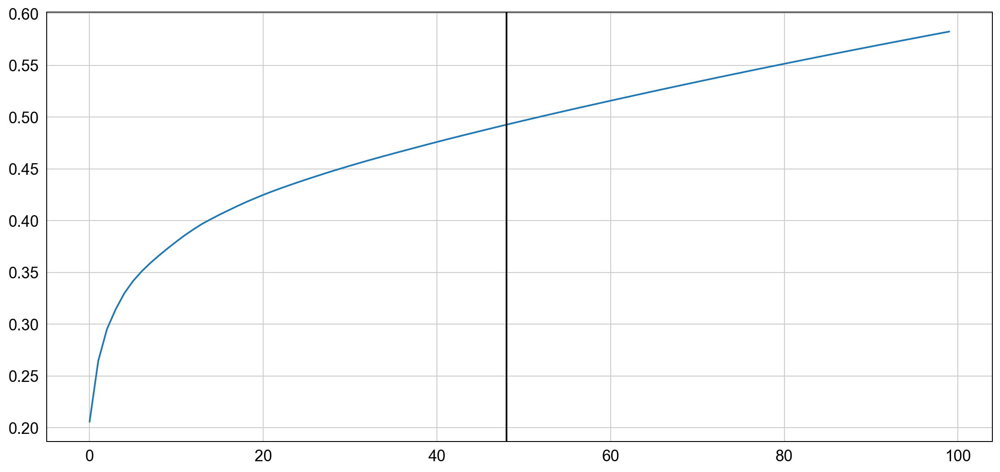

48


In [18]:
plt.plot(np.cumsum(oracle.pca.explained_variance_ratio_)[:100])
n_comps = np.where(np.diff(np.diff(np.cumsum(oracle.pca.explained_variance_ratio_))>0.002))[0][0]
plt.axvline(n_comps, c = "k")
plt.show()
print(n_comps)
n_comps = min(n_comps, 50)

- Estimate the optimal number of nearest neighbors for KNN imputation.

In [19]:
n_cell = oracle.adata.shape[0]
print(f"cell number is :{n_cell}")

cell number is :717


In [20]:
k = int(0.025*n_cell)
print(f"Auto-selected k is :{k}")

Auto-selected k is :17


In [21]:
oracle.knn_imputation(n_pca_dims = n_comps, k = k, balanced = True, b_sight = k*8,
                      b_maxl = k*4, n_jobs = 4)

-  Save and Load

### GRN calculation

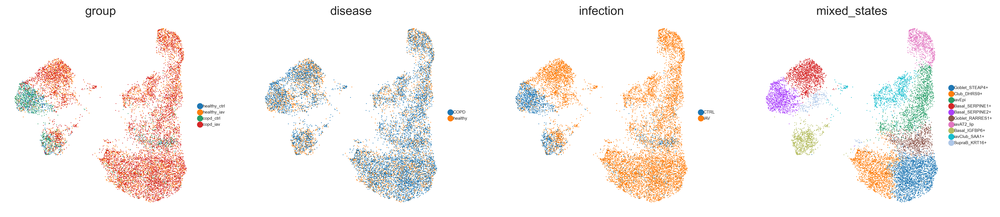

In [26]:
sc.pl.umap(BrEpit_mixed, frameon = False, color = ['group', 'disease', 'infection', 'mixed_states'], size = 3, legend_fontsize = 5, ncols = 4)

In [27]:
%%time
links = oracle.get_links(cluster_name_for_GRN_unit = "mixed_states", alpha = 10,
                         verbose_level = 10)

  0%|          | 0/9 [00:00<?, ?it/s]

Inferring GRN for Basal_IGFBP6+...


  0%|          | 0/539 [00:00<?, ?it/s]

Inferring GRN for Basal_SERPINE2+...


  0%|          | 0/539 [00:00<?, ?it/s]

Inferring GRN for Club_DHRS9+...


  0%|          | 0/539 [00:00<?, ?it/s]

Inferring GRN for Goblet_RARRES1+...


  0%|          | 0/539 [00:00<?, ?it/s]

Inferring GRN for Goblet_STEAP4+...


  0%|          | 0/539 [00:00<?, ?it/s]

Inferring GRN for SupraB_KRT16+...


  0%|          | 0/539 [00:00<?, ?it/s]

Inferring GRN for iavAT2_lip...


  0%|          | 0/539 [00:00<?, ?it/s]

Inferring GRN for iavClub_SAA1+...


  0%|          | 0/539 [00:00<?, ?it/s]

Inferring GRN for iavEpi...


  0%|          | 0/539 [00:00<?, ?it/s]

CPU times: user 1min 41s, sys: 3.69 s, total: 1min 44s
Wall time: 2min 35s


In [28]:
links.links_dict.keys()

dict_keys(['Basal_IGFBP6+', 'Basal_SERPINE2+', 'Club_DHRS9+', 'Goblet_RARRES1+', 'Goblet_STEAP4+', 'SupraB_KRT16+', 'iavAT2_lip', 'iavClub_SAA1+', 'iavEpi'])

In [31]:
links.links_dict["Basal_SERPINE2+"]

,source,target,coef_mean,coef_abs,p,-logp
0,FOS,ABCG1,-0.003405,0.003405,5.239156e-01,0.280739
1,ATOH8,ABCG1,0.064708,0.064708,8.243752e-08,7.083875
2,ZBTB33,ABCG1,0.049418,0.049418,7.547941e-13,12.122172
3,SMC3,ABCG1,0.051990,0.051990,2.702033e-13,12.568309
4,KLF12,ABCG1,-0.006482,0.006482,1.529324e-02,1.815500
...,...,...,...,...,...,...
7127,KLF7,ZNF557,0.067065,0.067065,5.601317e-11,10.251710
7128,TFAP2A,ZNF689,0.008949,0.008949,4.265585e-04,3.370021
7129,FOXA1,ZNF689,0.022235,0.022235,2.233578e-07,6.650999
7130,HEY1,ZNF689,0.001863,0.001863,1.092917e-01,0.961413


### Network preprocessing

In [32]:
links.filter_links(p = 0.001, weight = "coef_abs", threshold_number = 2000)

Basal_IGFBP6+


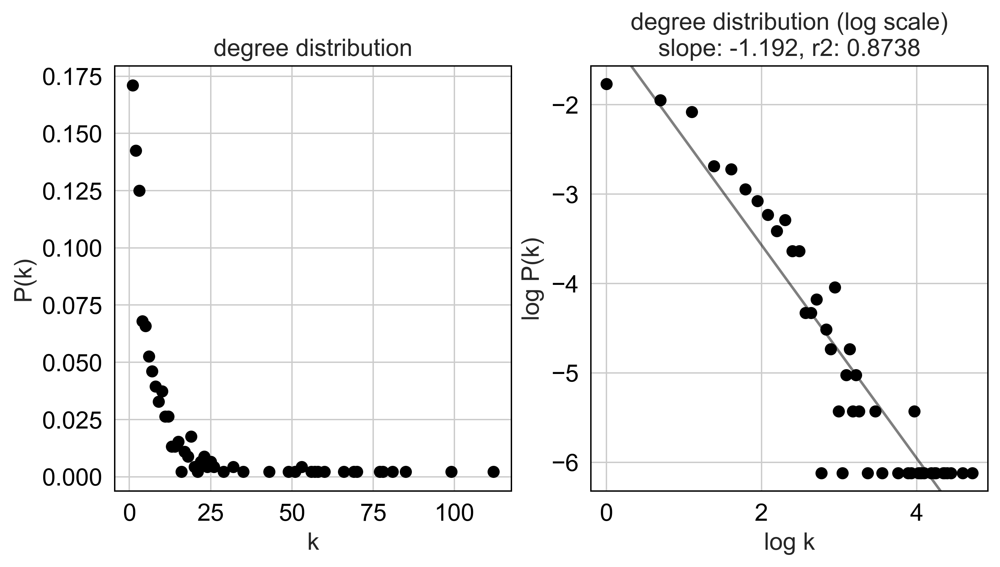

Basal_SERPINE2+


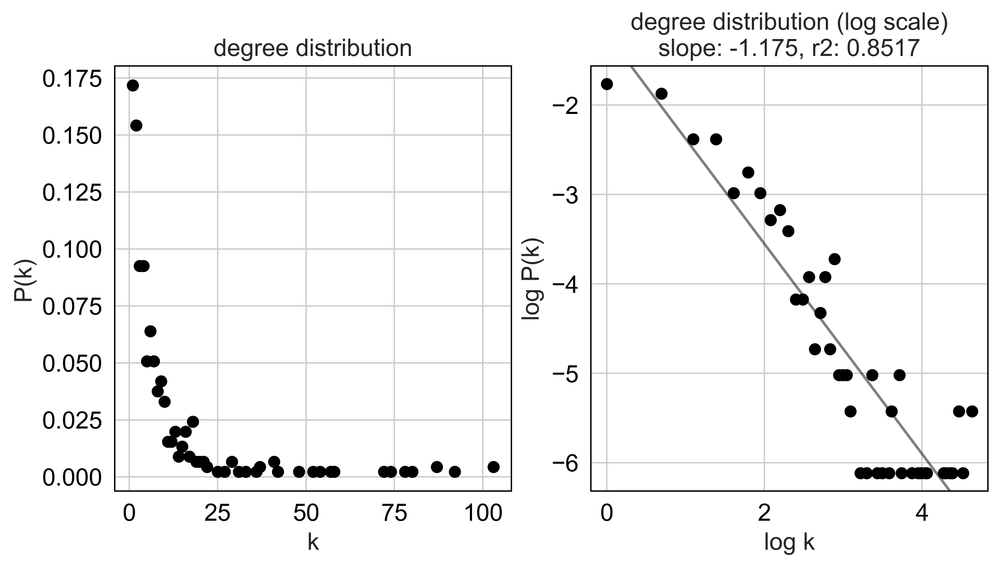

Club_DHRS9+


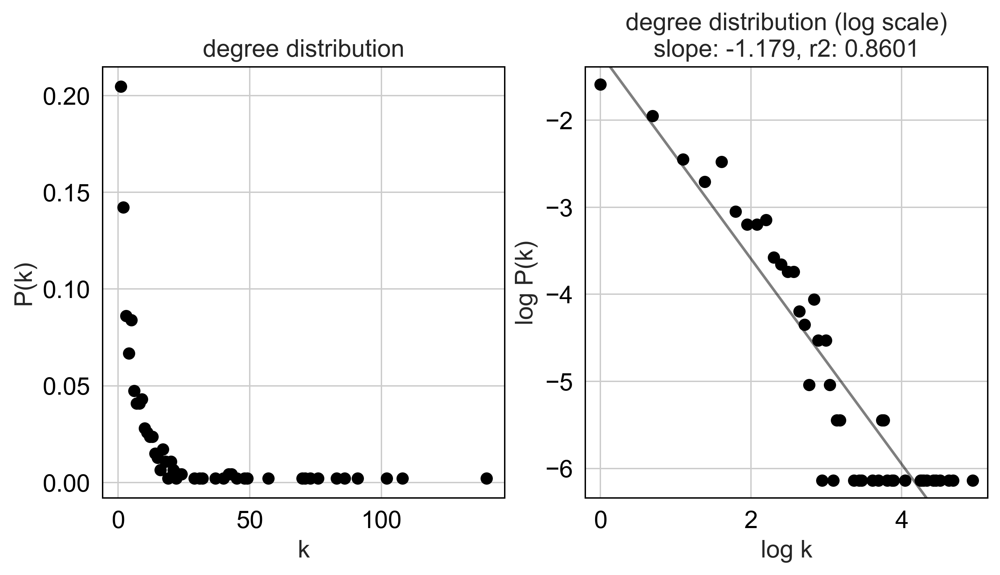

Goblet_RARRES1+


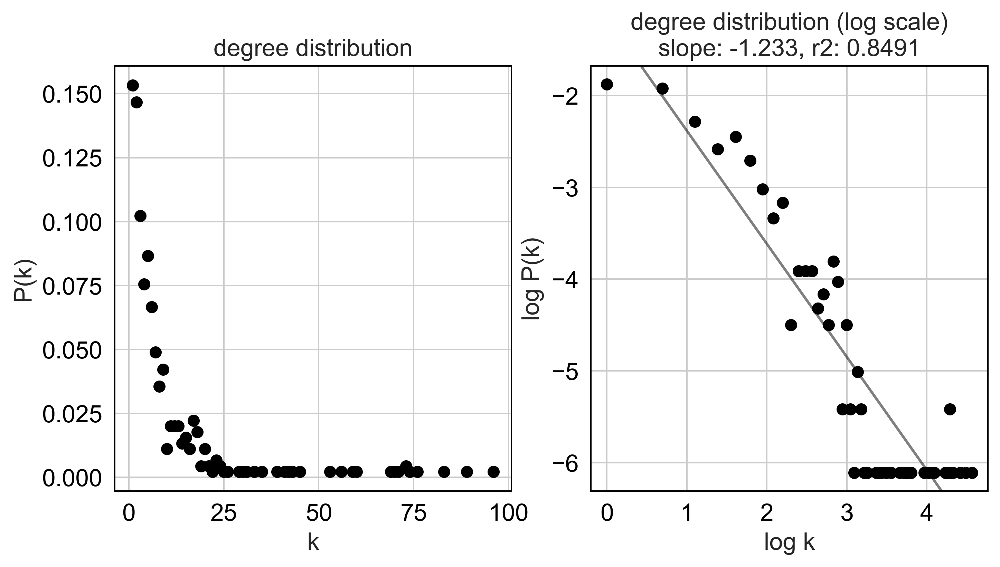

Goblet_STEAP4+


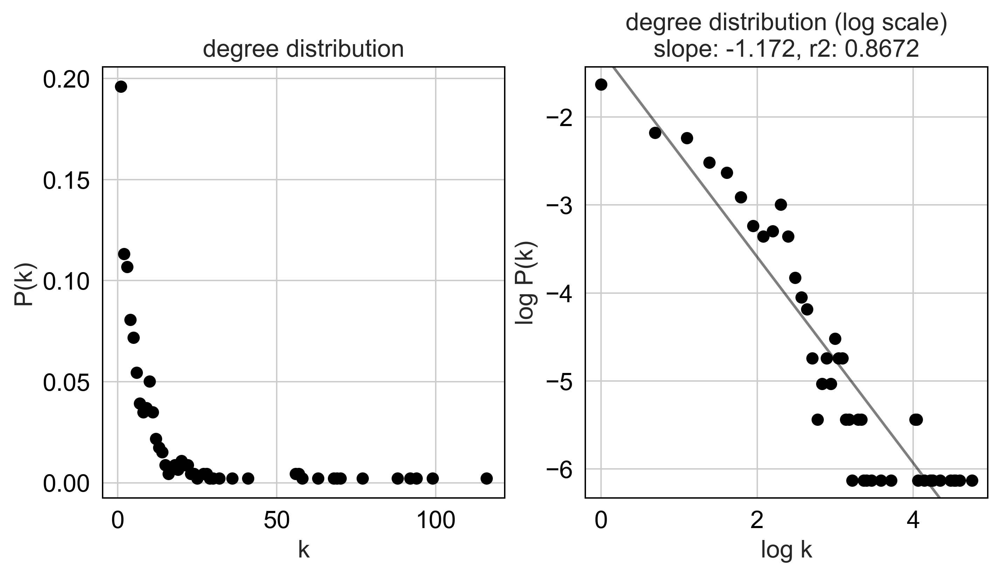

SupraB_KRT16+


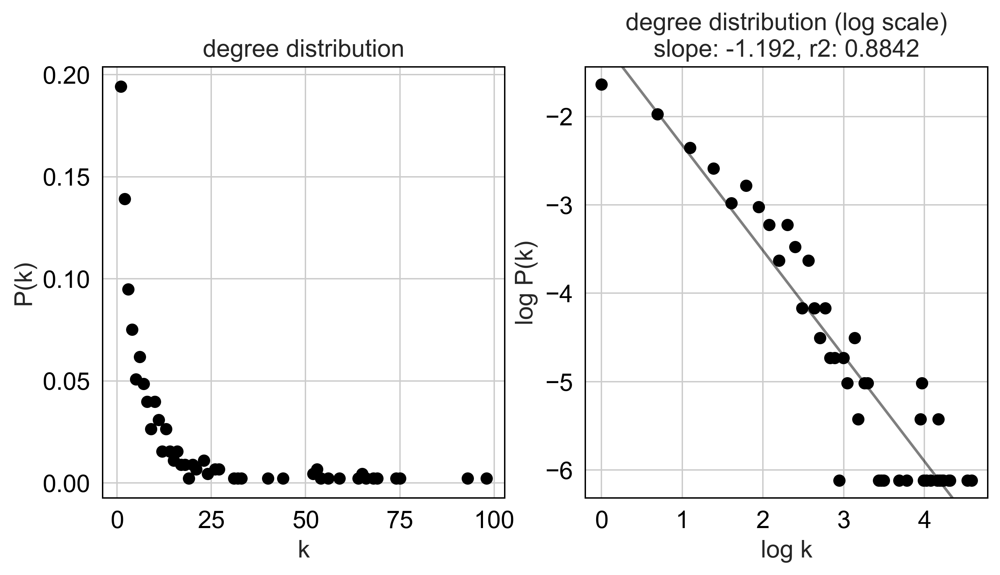

iavAT2_lip


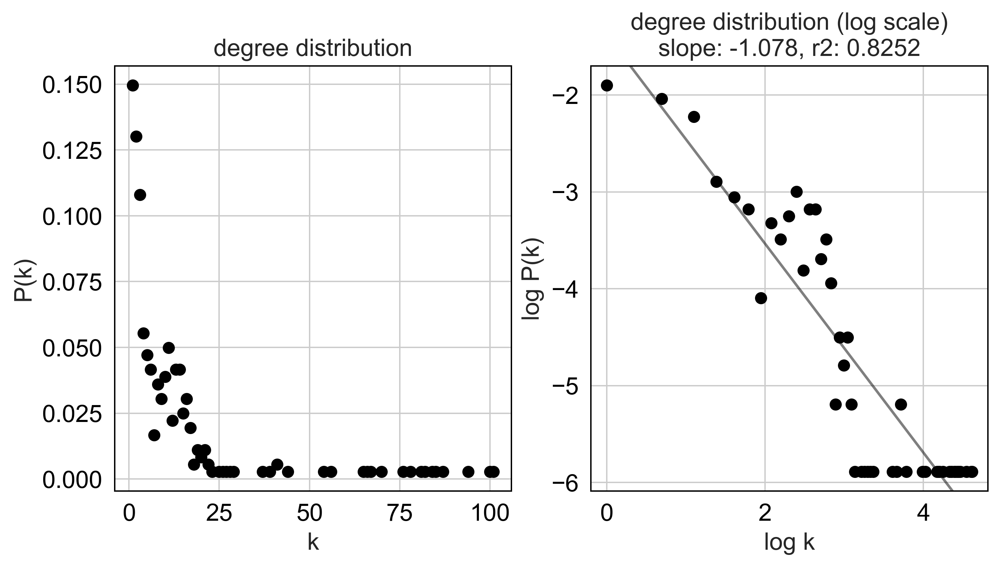

iavClub_SAA1+


ValueError: Length mismatch: Expected axis has 1 elements, new values have 2 elements

In [33]:
plt.rcParams["figure.figsize"] = [9, 4.5]
links.plot_degree_distributions(plot_model = True,
                                               #save=f"{save_folder}/degree_distribution/",
                                               )

### Calculate several network scores

In [34]:
links.get_network_score()
links.merged_score.head()

,degree_all,degree_centrality_all,degree_in,degree_centrality_in,degree_out,degree_centrality_out,betweenness_centrality,eigenvector_centrality,cluster
KLF7,112.0,0.246154,0.0,0.000000,112.0,0.246154,0.0,1.000000,Basal_IGFBP6+
IGFBP2,11.0,0.024176,11.0,0.024176,0.0,0.000000,0.0,0.407203,Basal_IGFBP6+
TP63,12.0,0.026374,3.0,0.006593,9.0,0.019780,287.0,0.095446,Basal_IGFBP6+
FGFBP1,4.0,0.008791,4.0,0.008791,0.0,0.000000,0.0,0.042529,Basal_IGFBP6+
TINAGL1,9.0,0.019780,9.0,0.019780,0.0,0.000000,0.0,0.357371,Basal_IGFBP6+


In [35]:
links.cluster

['Basal_IGFBP6+',
 'Basal_SERPINE2+',
 'Club_DHRS9+',
 'Goblet_RARRES1+',
 'Goblet_STEAP4+',
 'SupraB_KRT16+',
 'iavAT2_lip',
 'iavClub_SAA1+',
 'iavEpi']

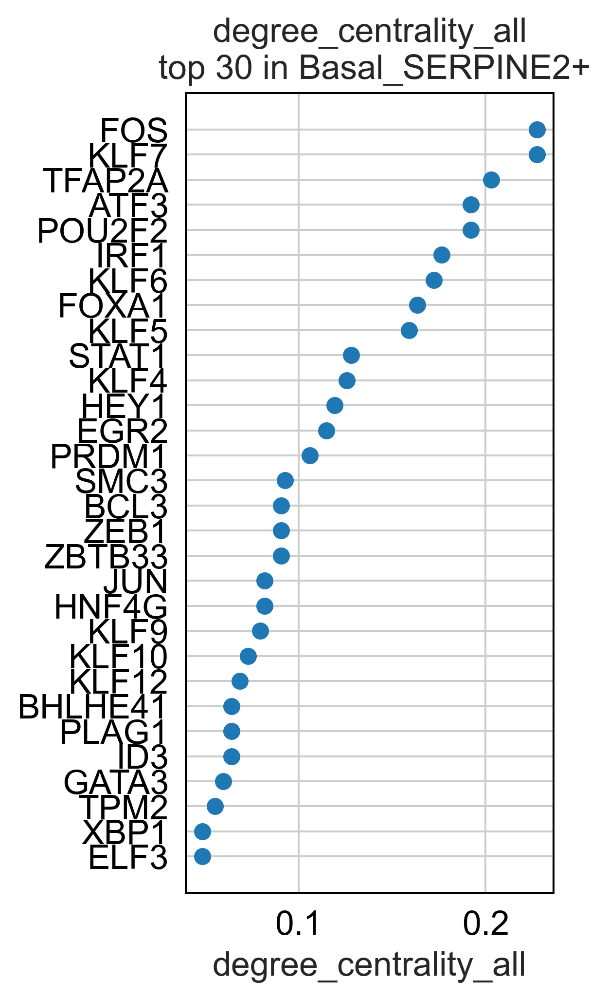

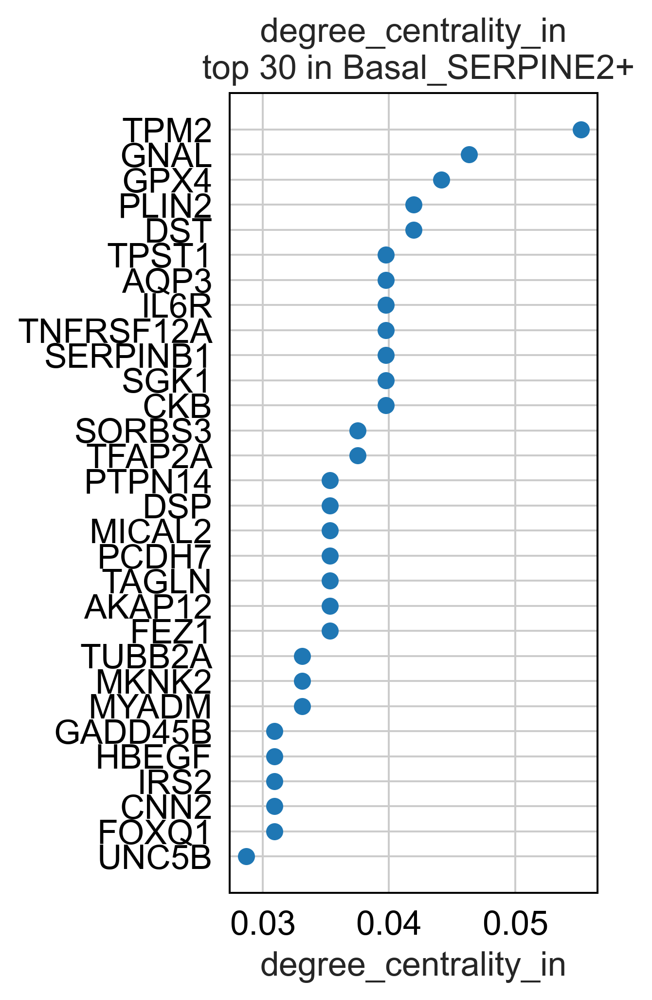

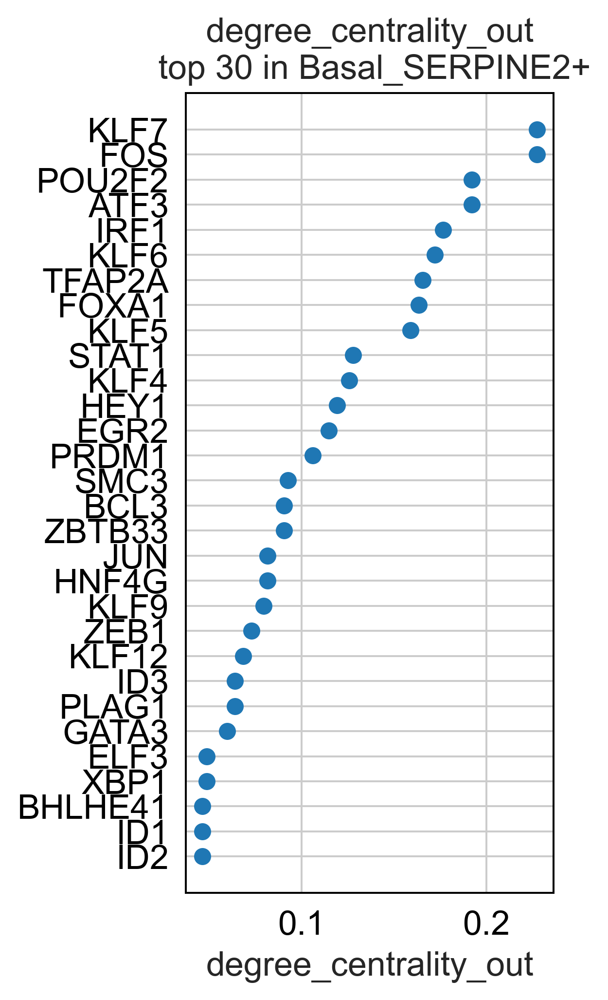

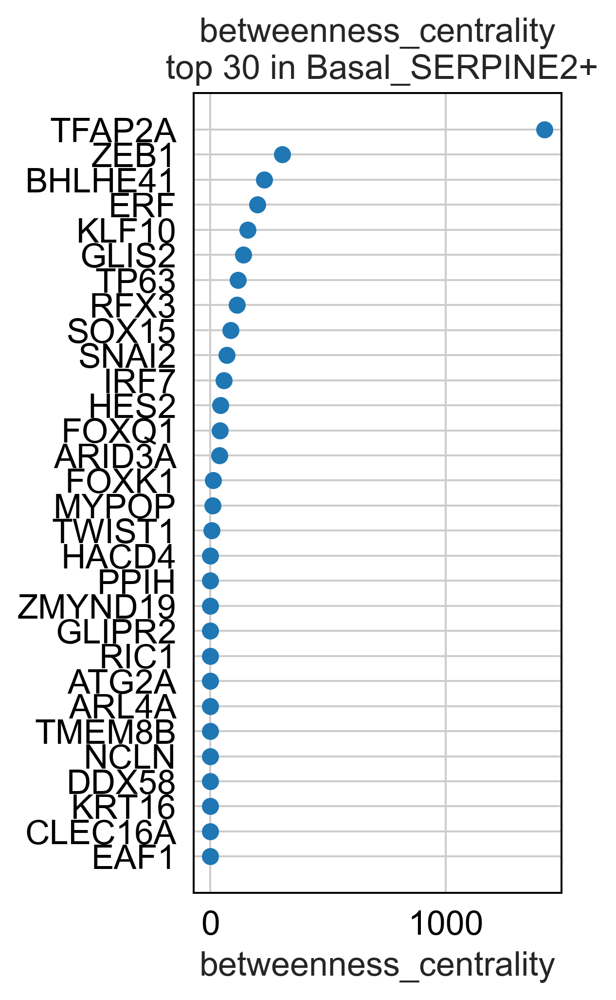

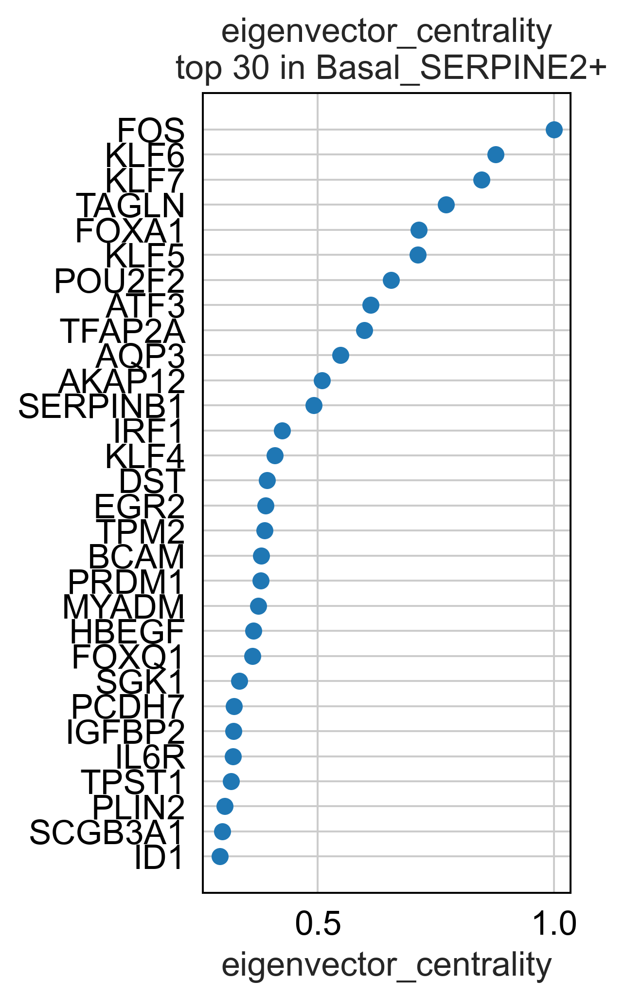

In [49]:
plt.rcParams["figure.figsize"] = [6, 6]
links.plot_scores_as_rank(cluster = "Basal_SERPINE2+", n_gene = 30, save = f"{save_folder}/Basal_SERPINE2+_ranked_score")

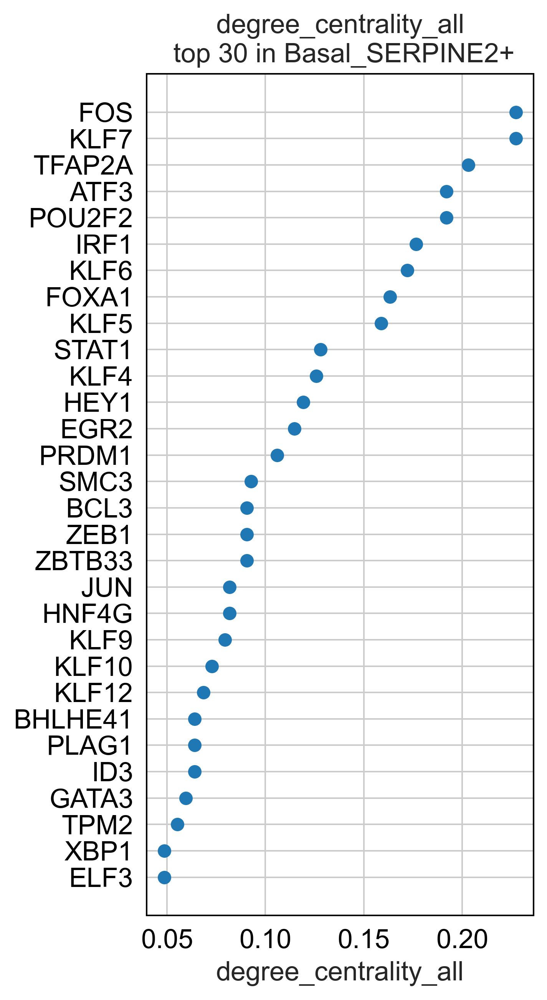

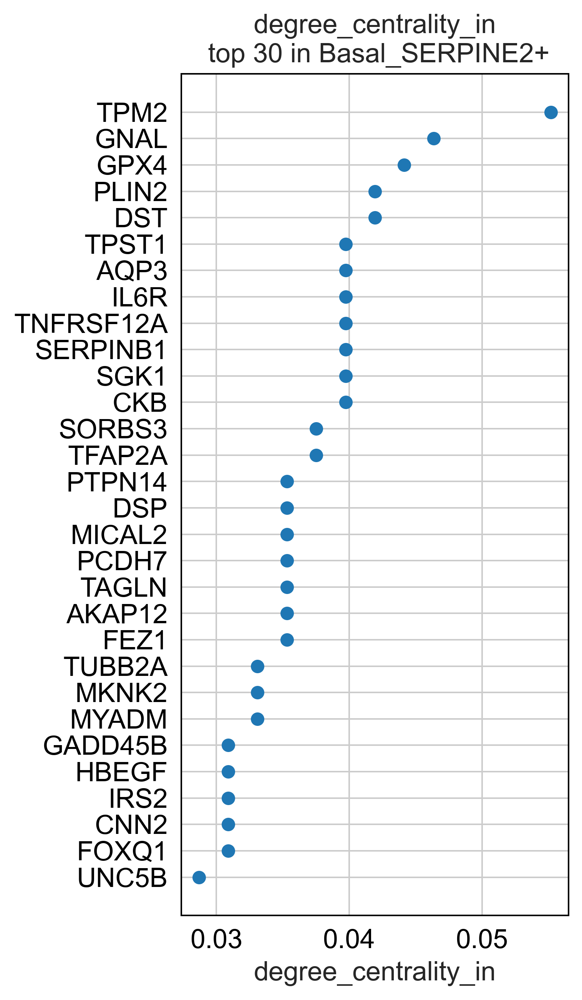

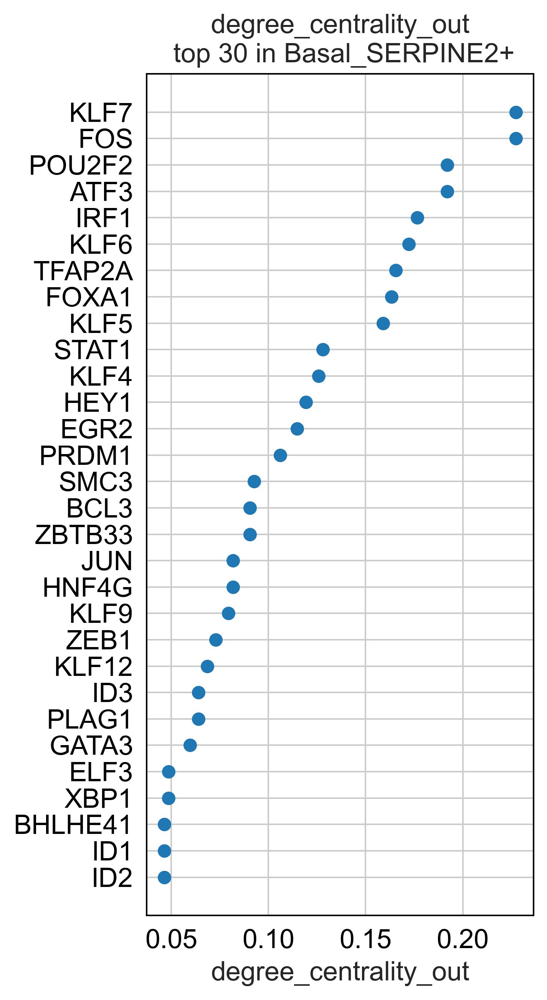

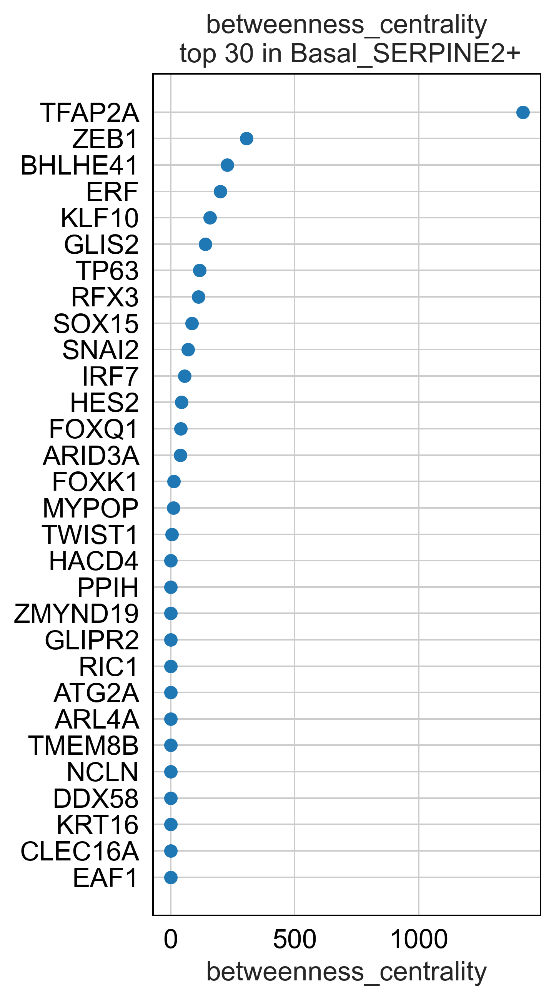

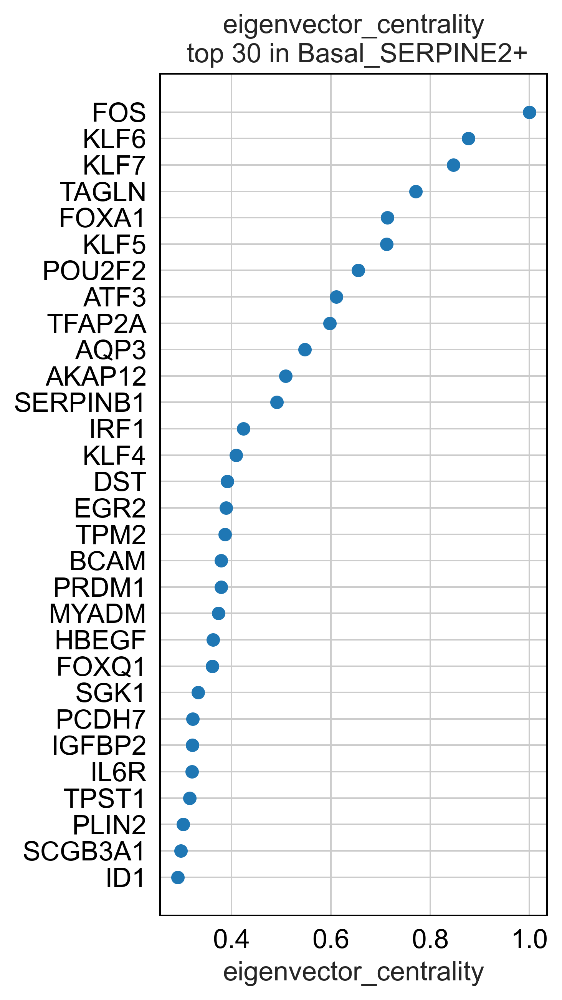

In [37]:
plt.rcParams["figure.figsize"] = [8, 8]
links.plot_scores_as_rank(cluster = "Basal_SERPINE2+", n_gene = 30, save = f"{save_folder}/Basal_SERPINE2+_ranked_score")

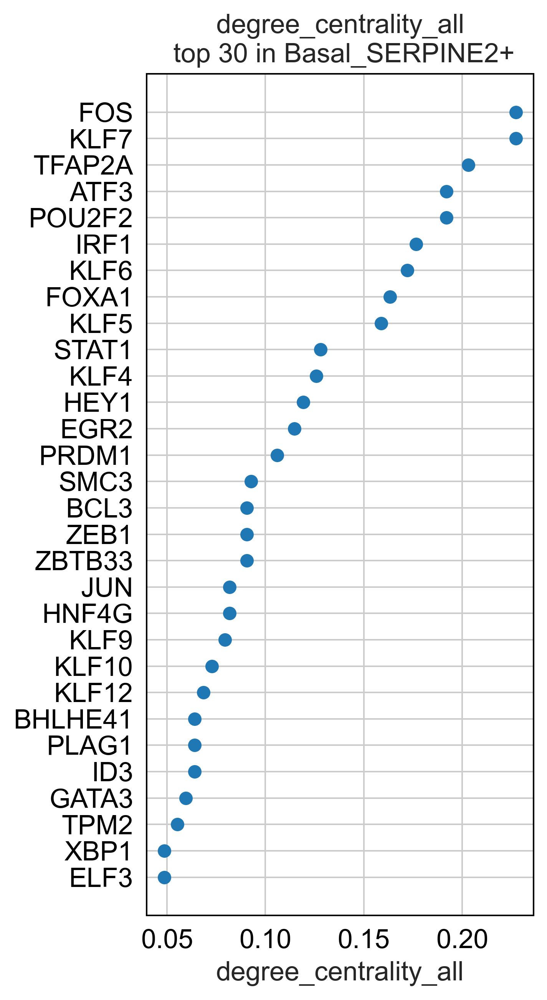

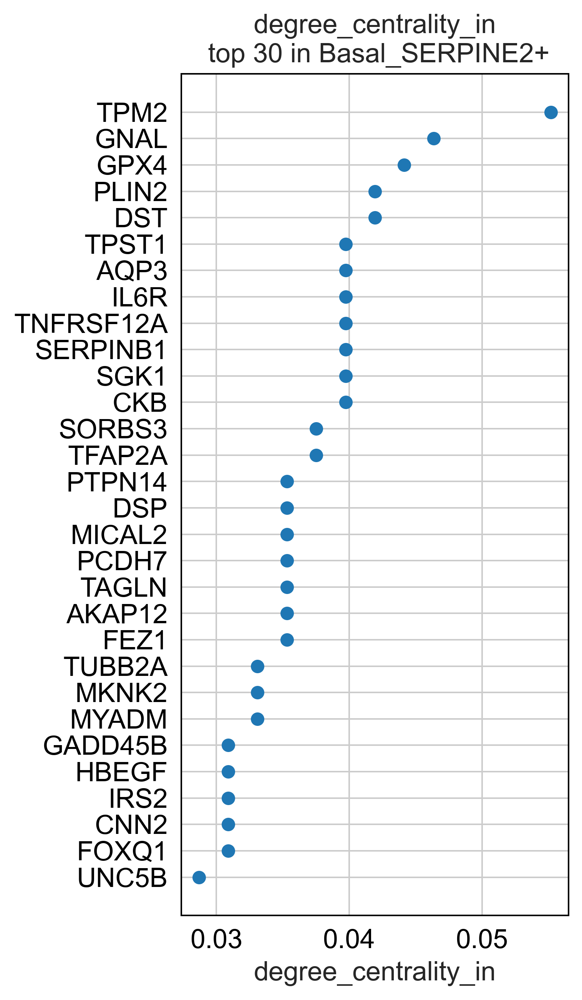

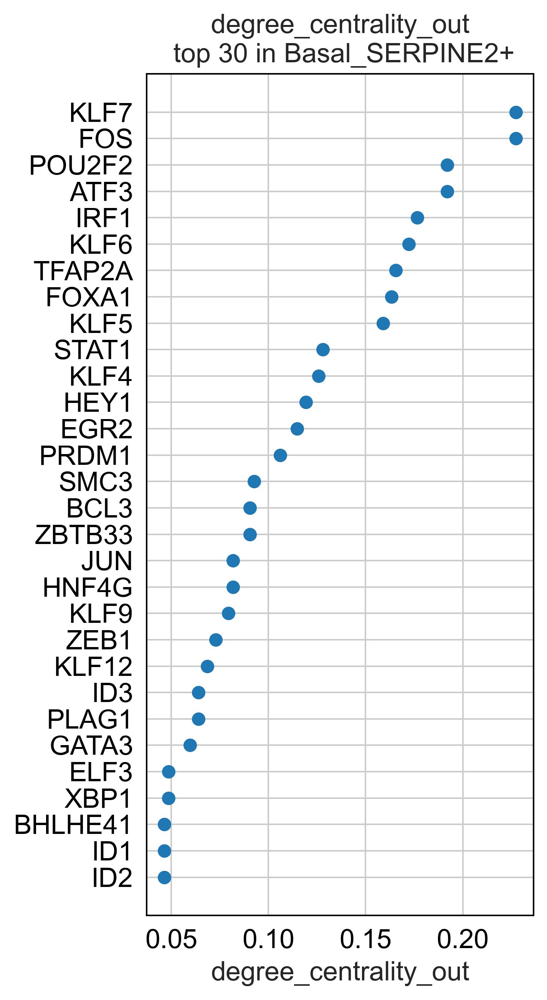

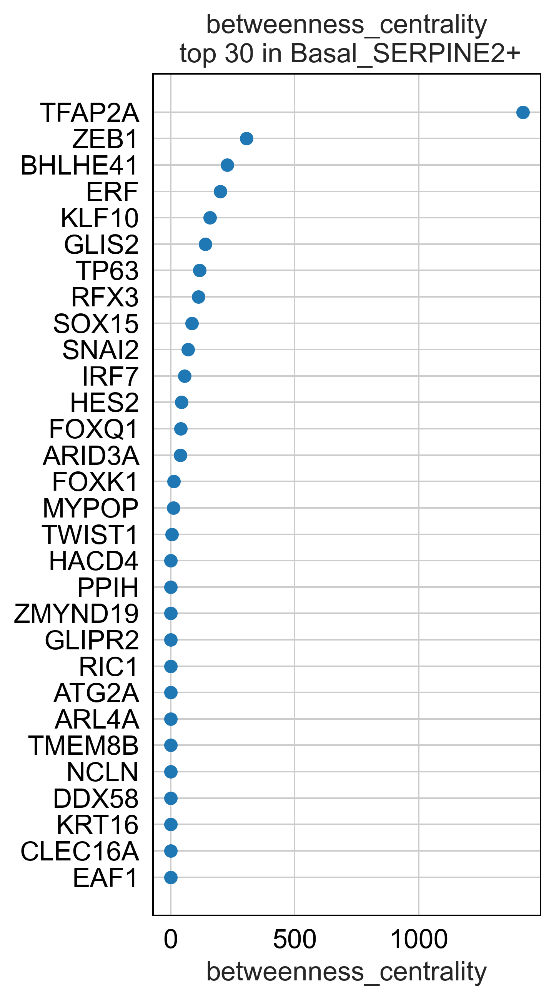

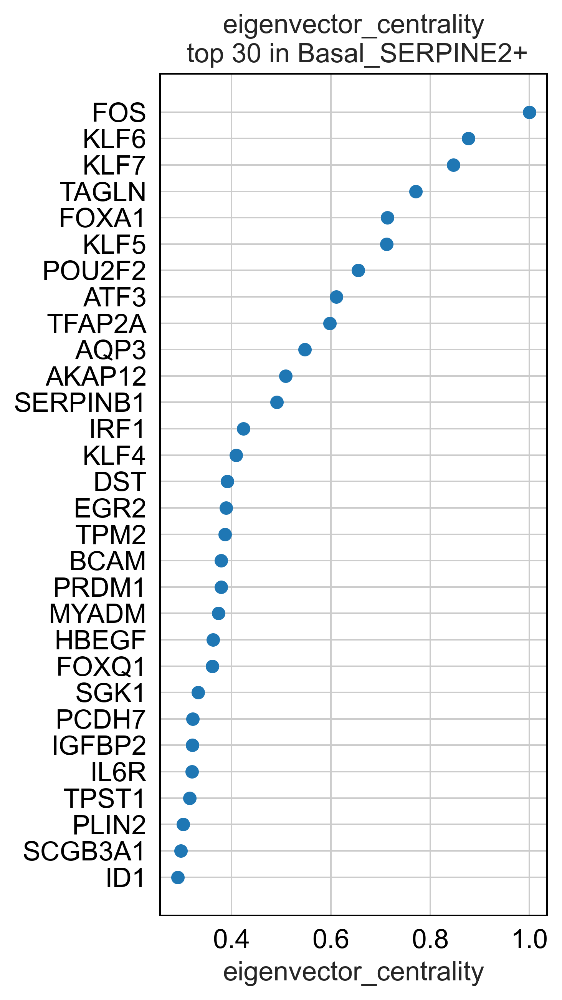

In [38]:
plt.rcParams["figure.figsize"] = [8, 8]
links.plot_scores_as_rank(cluster = "Basal_SERPINE2+", n_gene = 30, save = f"{save_folder}/Basal_SERPINE2+_ranked_score")

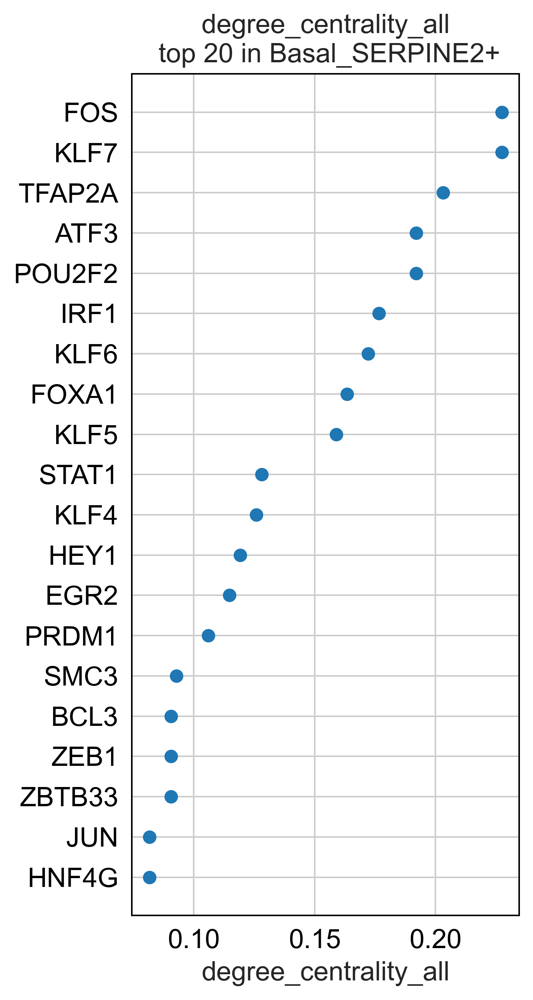

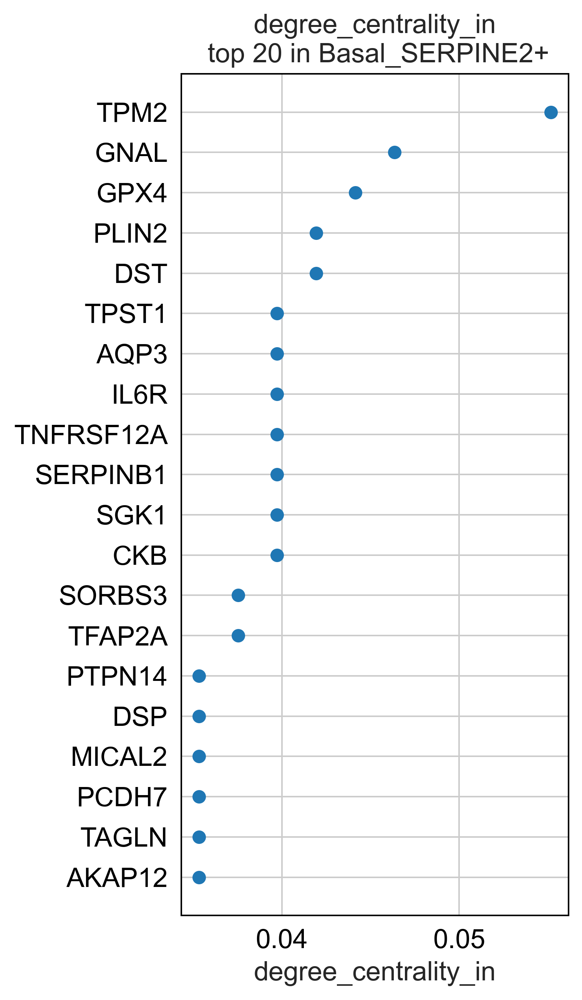

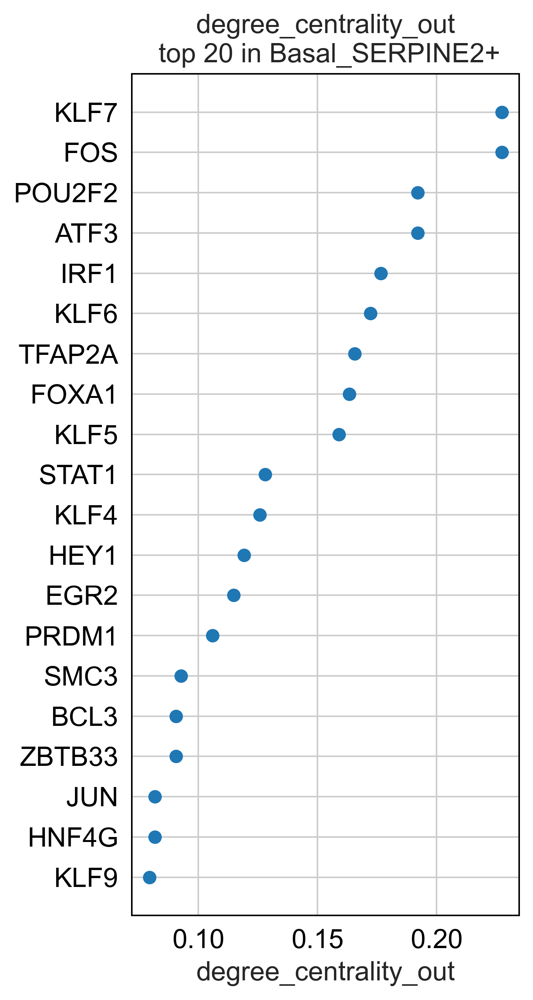

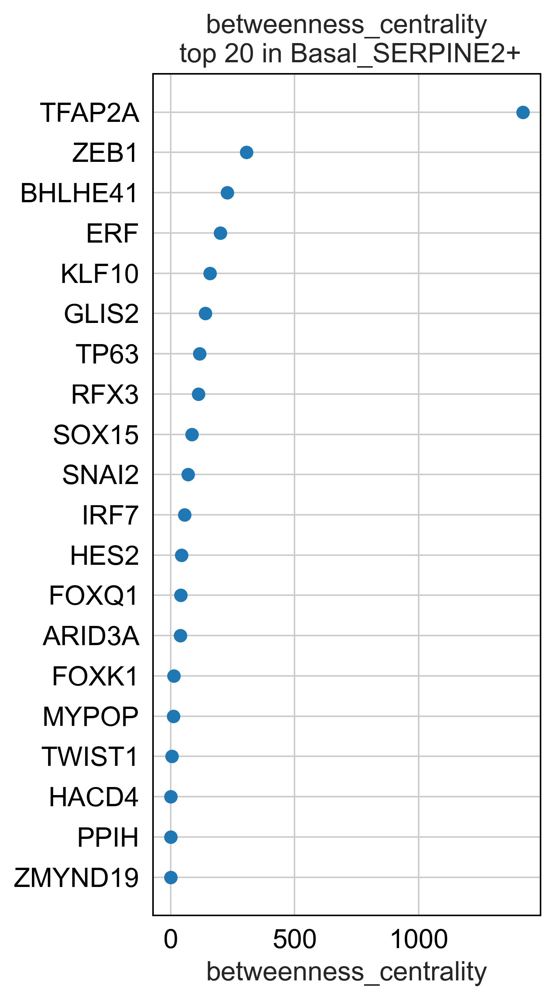

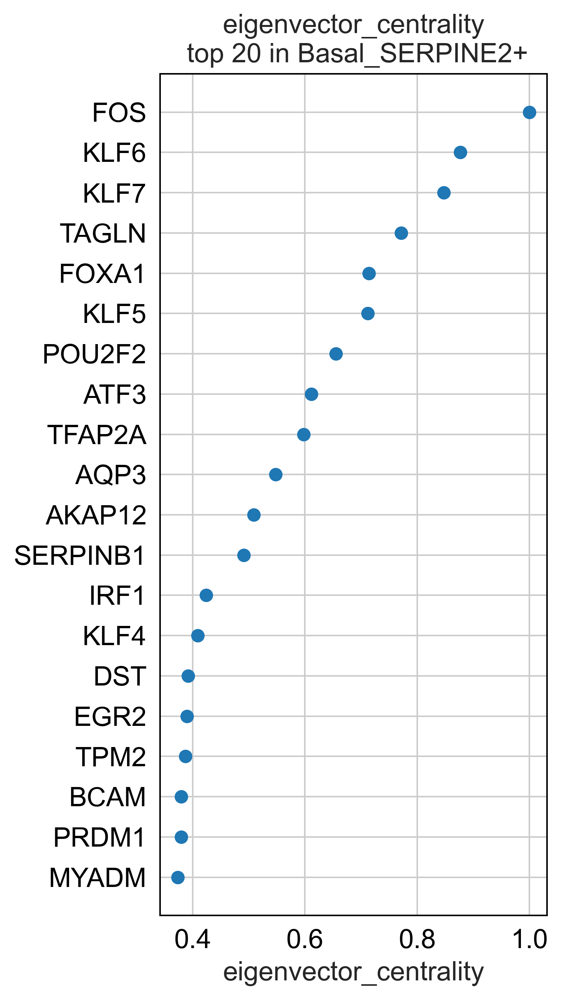

In [43]:
plt.rcParams["figure.figsize"] = [8, 8]
links.plot_scores_as_rank(cluster = "Basal_SERPINE2+", n_gene = 20, save = f"{save_folder}/Basal_SERPINE2+_ranked_score")

### Compare GRN structure between clusters

In [40]:
links.cluster

['Basal_IGFBP6+',
 'Basal_SERPINE2+',
 'Club_DHRS9+',
 'Goblet_RARRES1+',
 'Goblet_STEAP4+',
 'SupraB_KRT16+',
 'iavAT2_lip',
 'iavClub_SAA1+',
 'iavEpi']

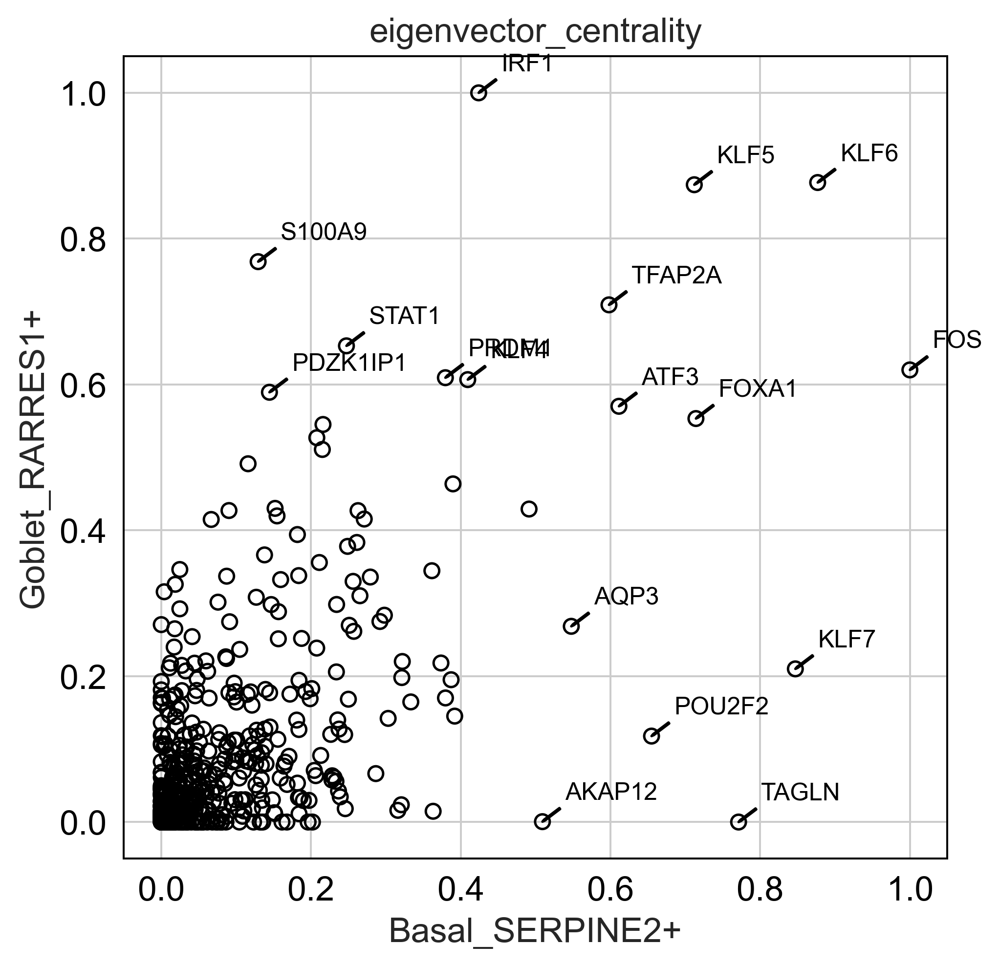

In [50]:
links.plot_score_comparison_2D(value = "eigenvector_centrality",
                               cluster1 = "Basal_SERPINE2+", cluster2 = "Goblet_RARRES1+",
                               percentile = 98,
                               save = f"{save_folder}/score_comparison")

KLF6


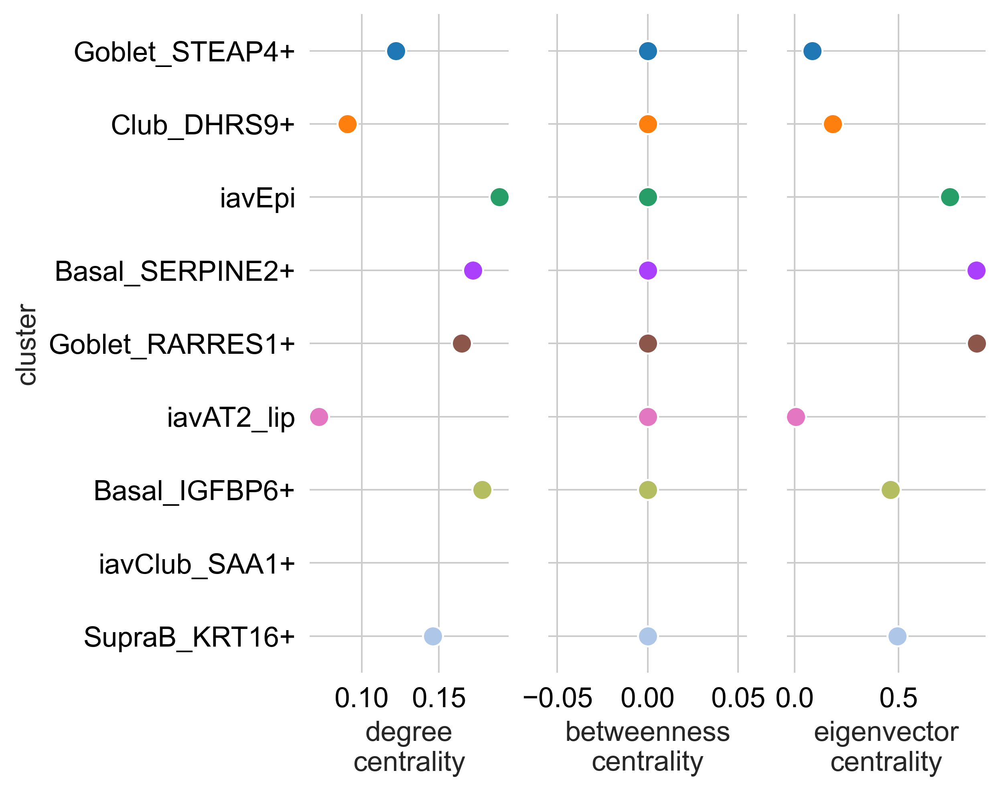

In [51]:
links.plot_score_per_cluster(goi="KLF6")

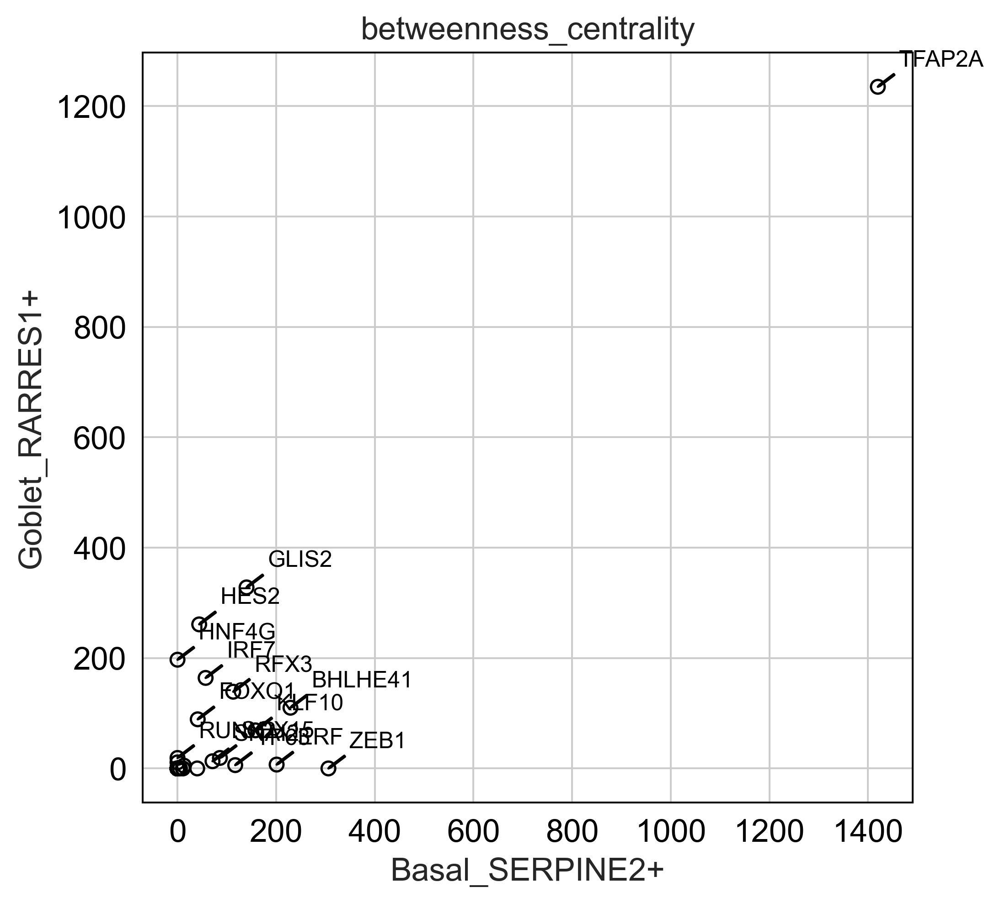

In [53]:
links.plot_score_comparison_2D(value = "betweenness_centrality",
                               cluster1 = "Basal_SERPINE2+", cluster2 = "Goblet_RARRES1+",
                               percentile = 98,
                               save = f"{save_folder}/score_comparison")

TFAP2A


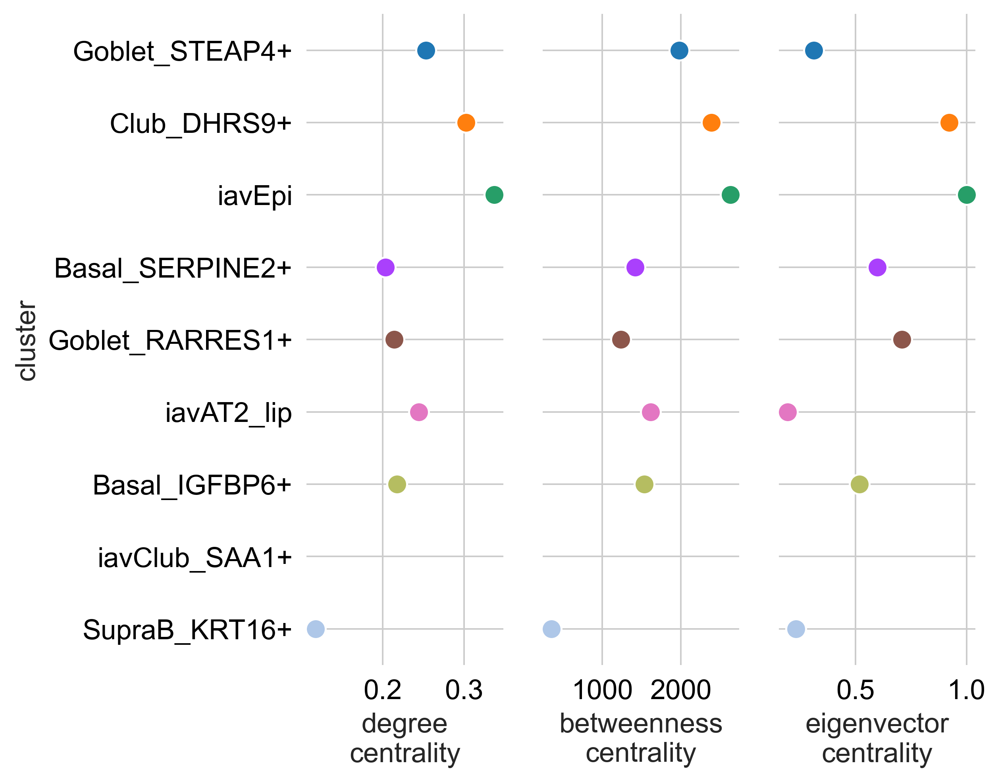

In [54]:
links.plot_score_per_cluster(goi="TFAP2A")

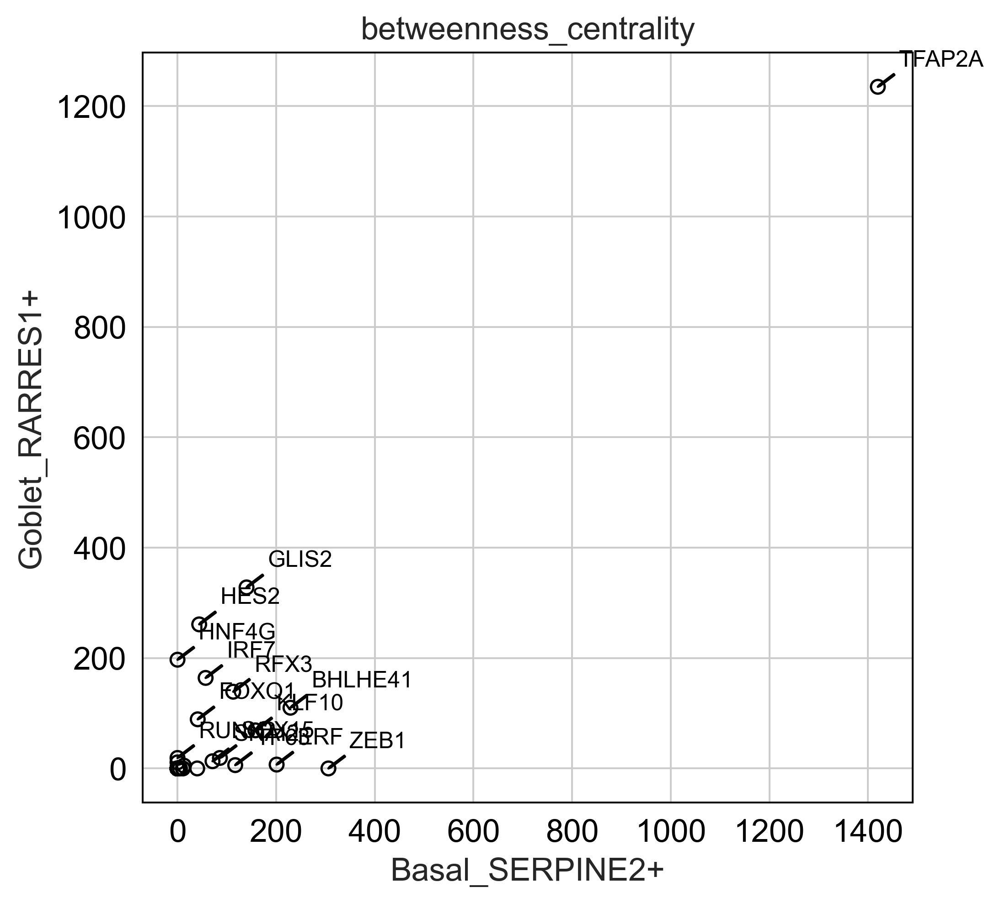

In [55]:
links.plot_score_comparison_2D(value = "betweenness_centrality",
                               cluster1 = "Basal_SERPINE2+", cluster2 = "Goblet_RARRES1+",
                               percentile = 98,
                               save = f"{save_folder}/score_comparison")

TFAP2A


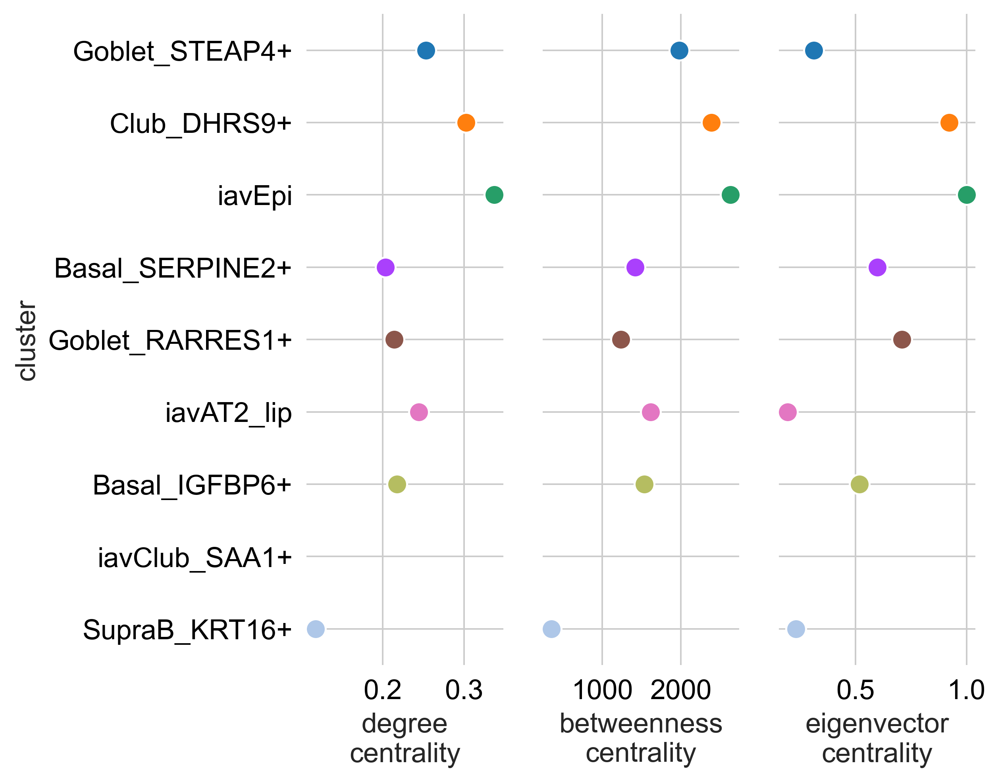

In [56]:
links.plot_score_per_cluster(goi = "TFAP2A", save = f"{save_folder}/network_score_per_gene/")

In [57]:
cluster_name = "Basal_SERPINE2+"
filtered_links_df = links.filtered_links[cluster_name]
filtered_links_df.head()

,source,target,coef_mean,coef_abs,p,-logp
3351,ID1,IGFBP2,0.689921,0.689921,4.344544e-17,16.362056
2245,TP63,FGFBP1,0.580091,0.580091,1.006647e-14,13.997123
5406,CREB3L1,SAA1,0.566292,0.566292,1.802352e-15,14.744160
3365,ID1,IGFBP3,0.520258,0.520258,9.248548e-15,14.033926
4156,POU2F2,MMP9,0.454835,0.454835,2.373470e-18,17.624616


In [58]:
filtered_links_df['source'].value_counts()

FOS       103
KLF7      103
POU2F2     87
ATF3       87
IRF1       80
         ... 
POU2F3      1
TBX19       1
EZH2        1
RARB        1
NKX3-1      1
Name: source, Length: 106, dtype: int64